In [77]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from plotnine import ggplot, aes, geom_count ,geom_violin ,geom_tile,scale_fill_gradient2

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
#import xgboost
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from datetime import datetime

from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_score,train_test_split, StratifiedKFold, learning_curve, KFold
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV, StratifiedShuffleSplit,RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline

from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error, r2_score

# Choose the model you want to use (replace 'ModelName' with the actual name)
from sklearn.tree import DecisionTreeRegressor  # Decision Tree
from sklearn.ensemble import RandomForestRegressor  # Random Forest
from sklearn.ensemble import GradientBoostingRegressor  # Gradient Boosting
from xgboost import XGBRegressor  # XGBoost
#import xgboost
#from lightgbm import LGBMRegressor  # LightGBM
#import lightgbm as lgb

from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor, ExtraTreesRegressor

from sklearn import tree
#from dtreeviz.trees import dtreeviz

# Import data

In [3]:
sample_sub = pd.read_csv('sample_submission.csv')
crab_train_data = pd.read_csv('train.csv')
crab_test_data = pd.read_csv('test.csv')

In [4]:
crab_train_data.head(10)

,id,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,0,I,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9
1,1,I,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8
2,2,M,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9
3,3,F,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11
4,4,I,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8
5,5,M,1.5000,1.1750,0.4125,28.845616,13.409313,6.789705,7.937860,10
6,6,M,1.5750,1.1375,0.3500,30.022120,11.935140,7.342521,8.646598,11
7,7,I,1.3125,1.0250,0.3500,18.299602,8.249704,3.898056,5.669900,11
8,8,F,1.6000,1.2875,0.4375,38.824640,16.967176,7.413394,10.772810,12
9,9,M,1.0250,0.7625,0.2625,10.305043,4.493396,2.126212,2.976698,11


# Explore data

#### Data cleaning checklist
- Data type
- Missing value
- Duplicate
- Outliers
- Standardize
- Categorical Data
- Feature Engineering

In [8]:
crab_train_data.shape

(74051, 10)

In [6]:
crab_train_data.dtypes

id                  int64
Sex                object
Length            float64
Diameter          float64
Height            float64
Weight            float64
Shucked Weight    float64
Viscera Weight    float64
Shell Weight      float64
Age                 int64
dtype: object

In [7]:
crab_train_data.isnull().sum()

id                0
Sex               0
Length            0
Diameter          0
Height            0
Weight            0
Shucked Weight    0
Viscera Weight    0
Shell Weight      0
Age               0
dtype: int64

In [11]:
crab_train_data.duplicated().sum()

0

In [15]:
crab_train_data[['id']].duplicated().sum()

0

In [12]:
crab_train_data.describe()

,id,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
count,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
mean,37025.000000,1.317460,1.024496,0.348089,23.385217,10.104270,5.058386,6.723870,9.967806
std,21376.826729,0.287757,0.237396,0.092034,12.648153,5.618025,2.792729,3.584372,3.175189
min,0.000000,0.187500,0.137500,0.000000,0.056699,0.028349,0.042524,0.042524,1.000000
25%,18512.500000,1.150000,0.887500,0.300000,13.437663,5.712424,2.863300,3.968930,8.000000
50%,37025.000000,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.931453,10.000000
75%,55537.500000,1.537500,1.200000,0.412500,32.162508,14.033003,6.988152,9.071840,11.000000
max,74050.000000,2.012815,1.612500,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


In [16]:
cat_col_ls = ['Sex']
num_col_ls = ['Length','Diameter','Height','Weight','Shucked Weight','Viscera Weight','Shell Weight','Age']


/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldco

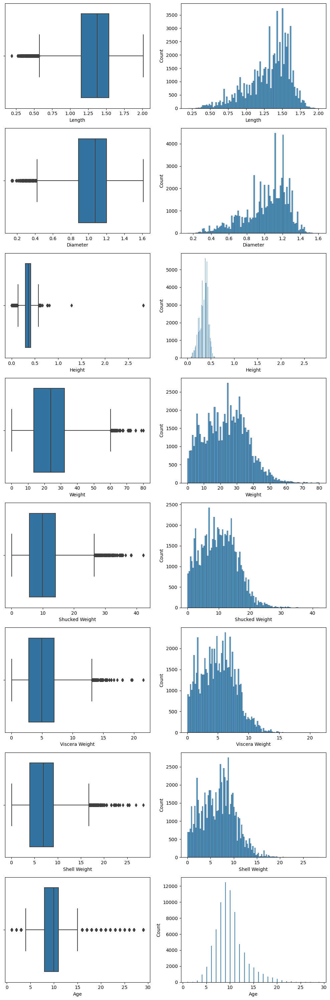

In [28]:
f = plt.figure(figsize=(10, 30))
gs = f.add_gridspec(8, 2)

for i,col in enumerate(num_col_ls):
    ax = f.add_subplot(gs[i, 0])
    sns.boxplot(x=crab_train_data[col])

    ax = f.add_subplot(gs[i, 1])
    sns.histplot(data=crab_train_data, x=col)


f.tight_layout()


In [29]:
crab_train_data['Sex'].value_counts()

Sex
M    27084
I    23957
F    23010
Name: count, dtype: int64

## Visualize some insight

In [30]:
crab_train_data.head()

,id,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,0,I,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9
1,1,I,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8
2,2,M,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9
3,3,F,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11
4,4,I,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8


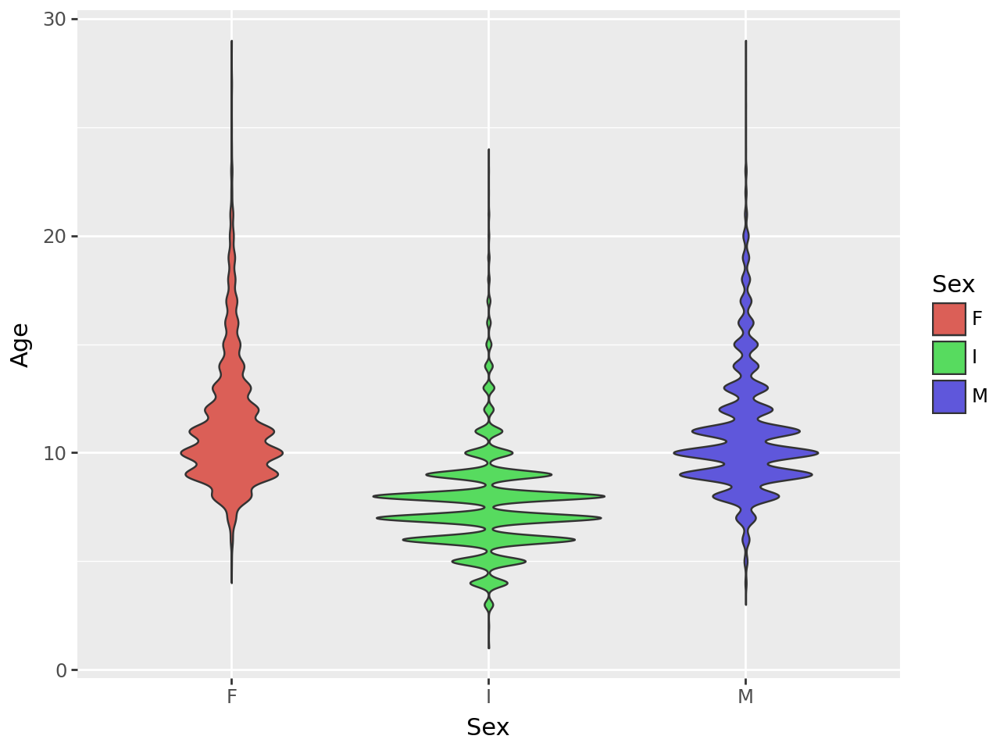

In [31]:
ggplot(crab_train_data) + aes(x='Sex',y='Age',fill='Sex') + geom_violin()

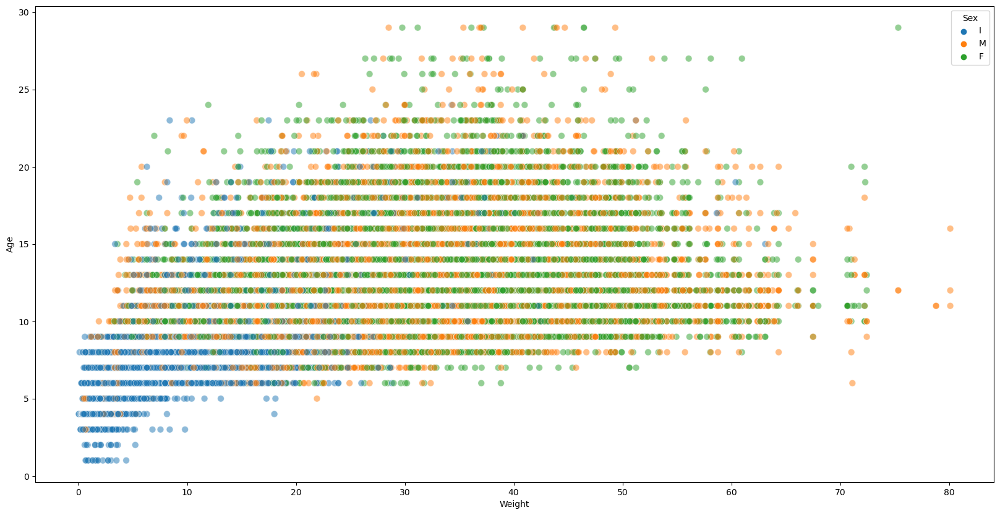

In [33]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data, x="Weight", y="Age", hue="Sex",s=60,alpha=0.5)
plt.show()

In [34]:
crab_train_data_eda = crab_train_data.drop("id",axis=1)

/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldco

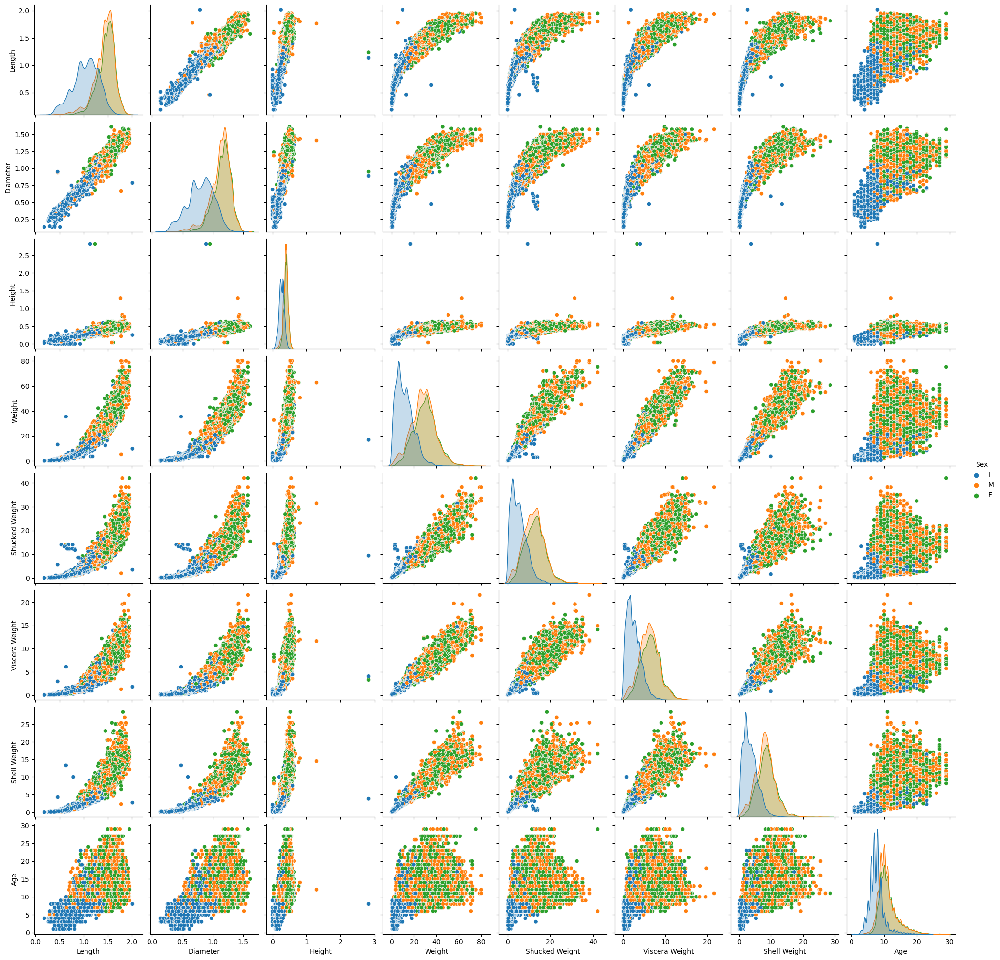

In [35]:
sns.pairplot(crab_train_data_eda, hue="Sex")

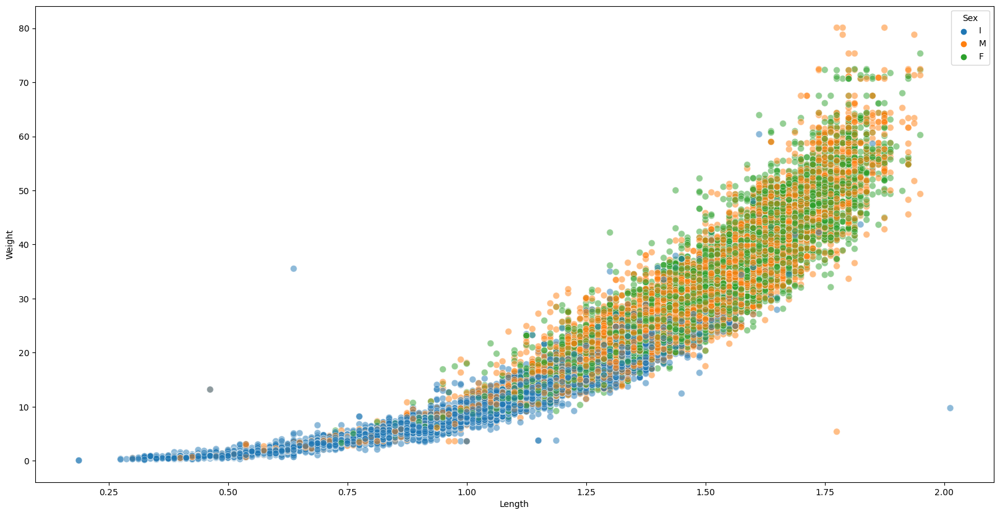

In [36]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data_eda, y="Weight", x="Length", hue="Sex",s=60,alpha=0.5)
plt.show()

In [37]:
crab_train_data_eda['sqrt_weight'] = crab_train_data_eda['Weight']**0.5

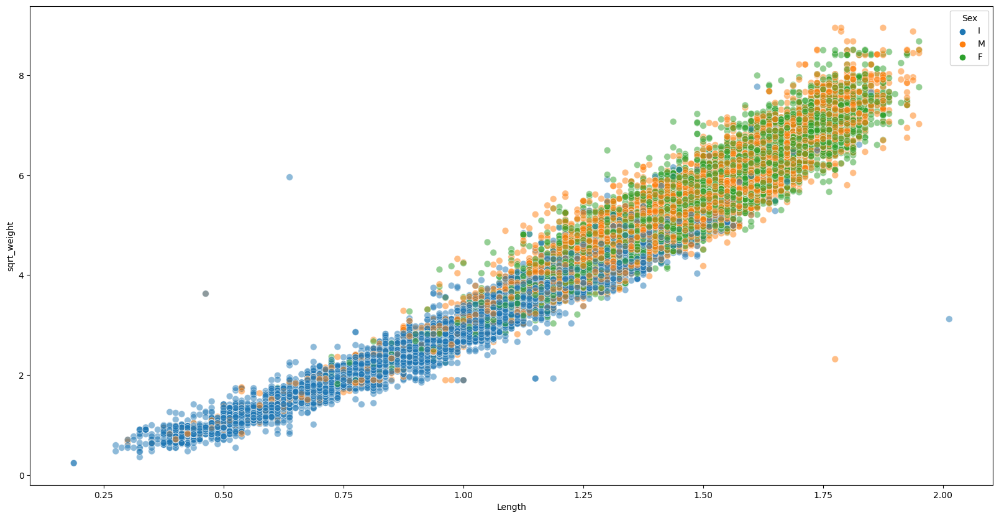

In [39]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data_eda, y="sqrt_weight", x="Length", hue="Sex",s=60,alpha=0.5)
plt.show()

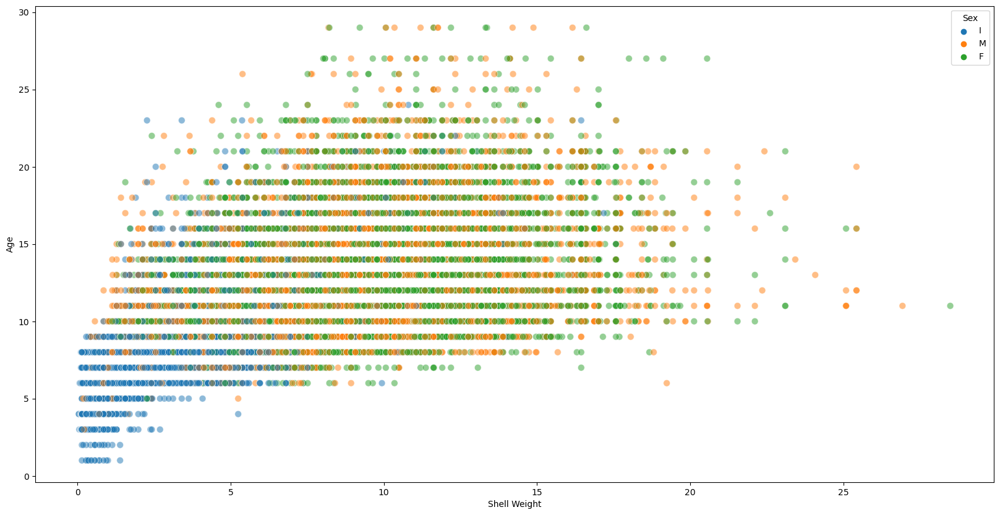

In [61]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data_eda, y="Age", x="Shell Weight", hue="Sex",s=60,alpha=0.5)
plt.show()

In [62]:
crab_train_data_eda['sqrt_shell_weight'] = crab_train_data_eda['Shell Weight']**0.5

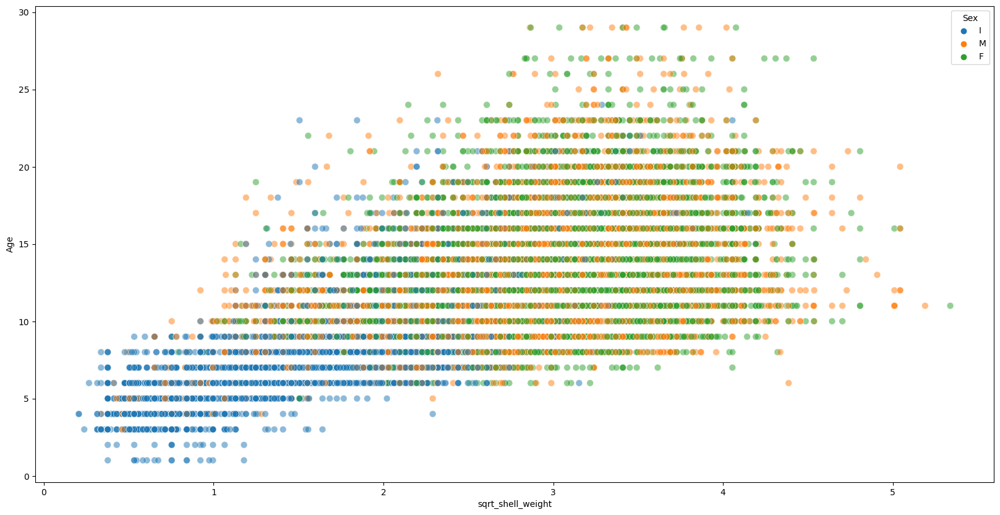

In [63]:
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data_eda, y="Age", x="sqrt_shell_weight", hue="Sex",s=60,alpha=0.5)
plt.show()

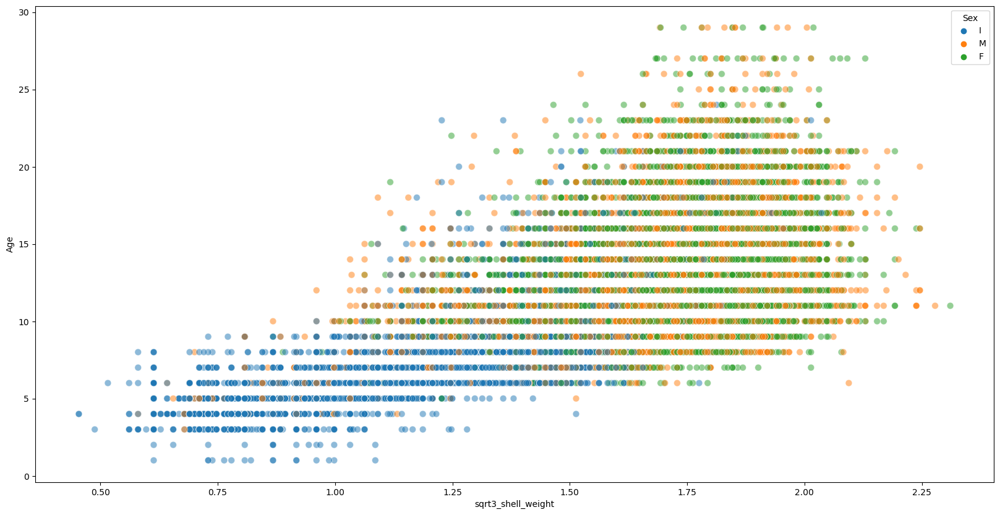

In [67]:
crab_train_data_eda['sqrt3_shell_weight'] = crab_train_data_eda['Shell Weight']**0.25
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data_eda, y="Age", x="sqrt3_shell_weight", hue="Sex",s=60,alpha=0.5)
plt.show()

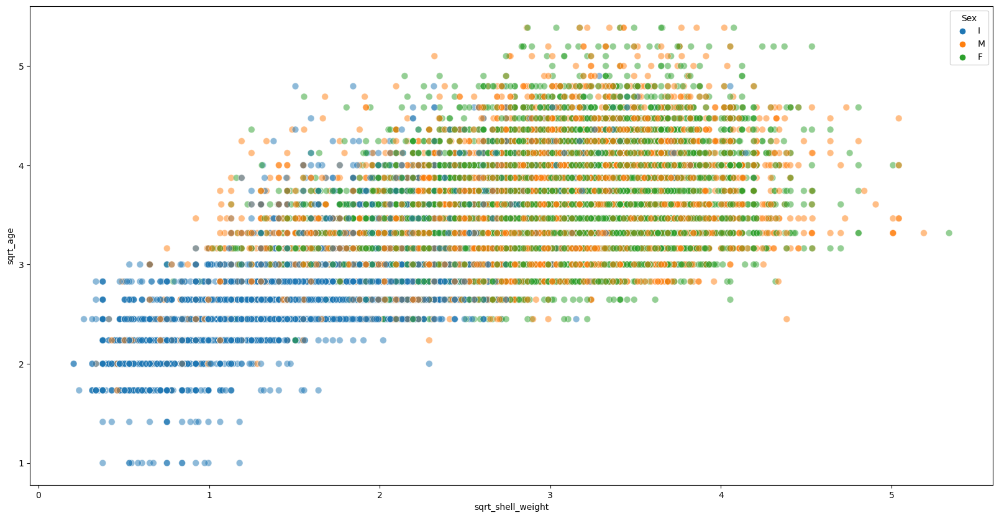

In [65]:
crab_train_data_eda['sqrt_age'] = crab_train_data_eda['Age']**0.5
plt.figure(figsize=(20,10))
sns.scatterplot(data=crab_train_data_eda, y="sqrt_age", x="sqrt_shell_weight", hue="Sex",s=60,alpha=0.5)
plt.show()

<Axes: >

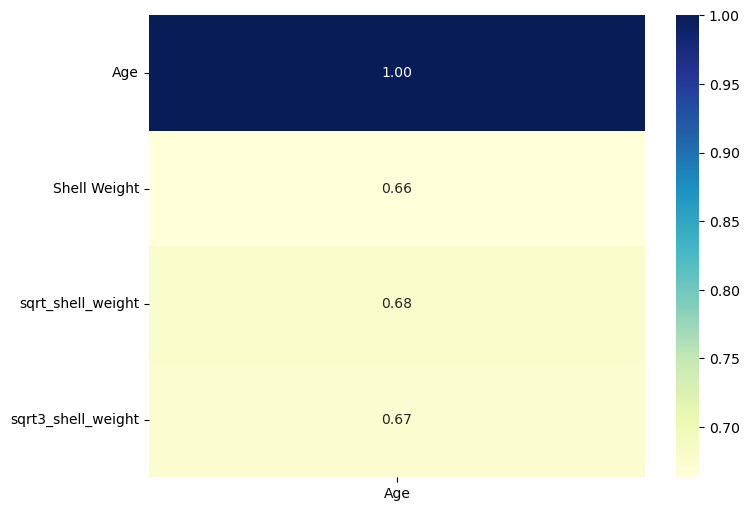

In [68]:
plt.figure(figsize=(8, 6))
sns.heatmap(crab_train_data_eda[['Age','Shell Weight','sqrt_shell_weight','sqrt3_shell_weight']].corr()[['Age']], annot=True, fmt=".2f", annot_kws={"size": 10}, cmap="YlGnBu")


# Prepare data before train model

#### Data prep checklist

- Outliers
- train test validate split
- Standardize
- Categorical Data
- Feature Engineering

In [42]:
crab_train_data_prep = crab_train_data.drop("id",axis=1)

In [43]:
crab_train_data_prep.tail()

,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
74046,F,1.6625,1.2625,0.4375,50.660556,20.680960,10.361742,12.332033,10
74047,I,1.0750,0.8625,0.2750,10.446791,4.323299,2.296310,3.543687,6
74048,F,1.4875,1.2000,0.4125,29.483480,12.303683,7.540967,8.079607,10
74049,I,1.2125,0.9625,0.3125,16.768729,8.972617,2.919999,4.280774,8
74050,I,0.9125,0.6750,0.2000,5.386405,2.055339,1.034757,1.700970,6


In [45]:
# Outlier

# calculate IQR for column Length
Q1 = crab_train_data_prep['Length'].quantile(0.25)
Q3 = crab_train_data_prep['Length'].quantile(0.75)
IQR = Q3 - Q1

# identify outliers
threshold = 1.5
outliers = crab_train_data_prep[(crab_train_data_prep['Length'] < Q1 - threshold * IQR) |
                               (crab_train_data_prep['Length'] > Q3 + threshold * IQR)]

print("Q1 : " + str(Q1))
print("Q3 : " + str(Q3))

Q1 : 1.15
Q3 : 1.5375


In [46]:
for col in num_col_ls:
    Q1 = crab_train_data_prep[col].quantile(0.25)
    Q3 = crab_train_data_prep[col].quantile(0.75)
    IQR = Q3 - Q1
    
    threshold = 1.5
    outliers = crab_train_data_prep[(crab_train_data_prep[col] < Q1 - threshold * IQR) | 
                                   (crab_train_data_prep[col] > Q3 + threshold * IQR)]
    
    print(col)
    print("Q1 : " + str(Q1))
    print("Q3 : " + str(Q3))
    print("----------------------")
    
    crab_train_data_prep = crab_train_data_prep.drop(outliers.index)

Length
Q1 : 1.15
Q3 : 1.5375
----------------------
Diameter
Q1 : 0.9
Q3 : 1.2
----------------------
Height
Q1 : 0.3
Q3 : 0.4125
----------------------
Weight
Q1 : 14.10387625
Q3 : 32.36095425
----------------------
Shucked Weight
Q1 : 5.99591925
Q3 : 14.061352
----------------------
Viscera Weight
Q1 : 2.9766975
Q3 : 7.0023265
----------------------
Shell Weight
Q1 : 4.1106775
Q3 : 9.07184
----------------------
Age
Q1 : 8.0
Q3 : 11.0
----------------------


In [47]:
crab_train_data_prep.shape

(66922, 9)

/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldco

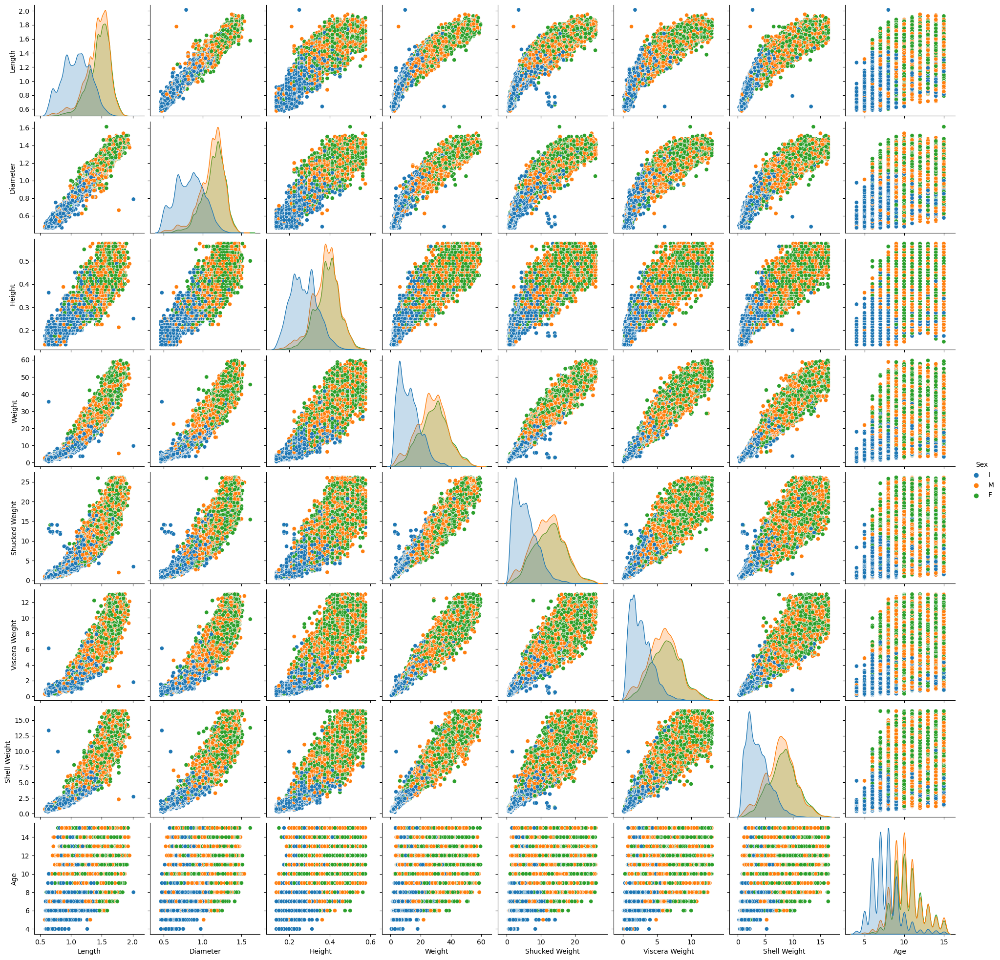

In [49]:
sns.pairplot(crab_train_data_prep, hue="Sex")

<Axes: >

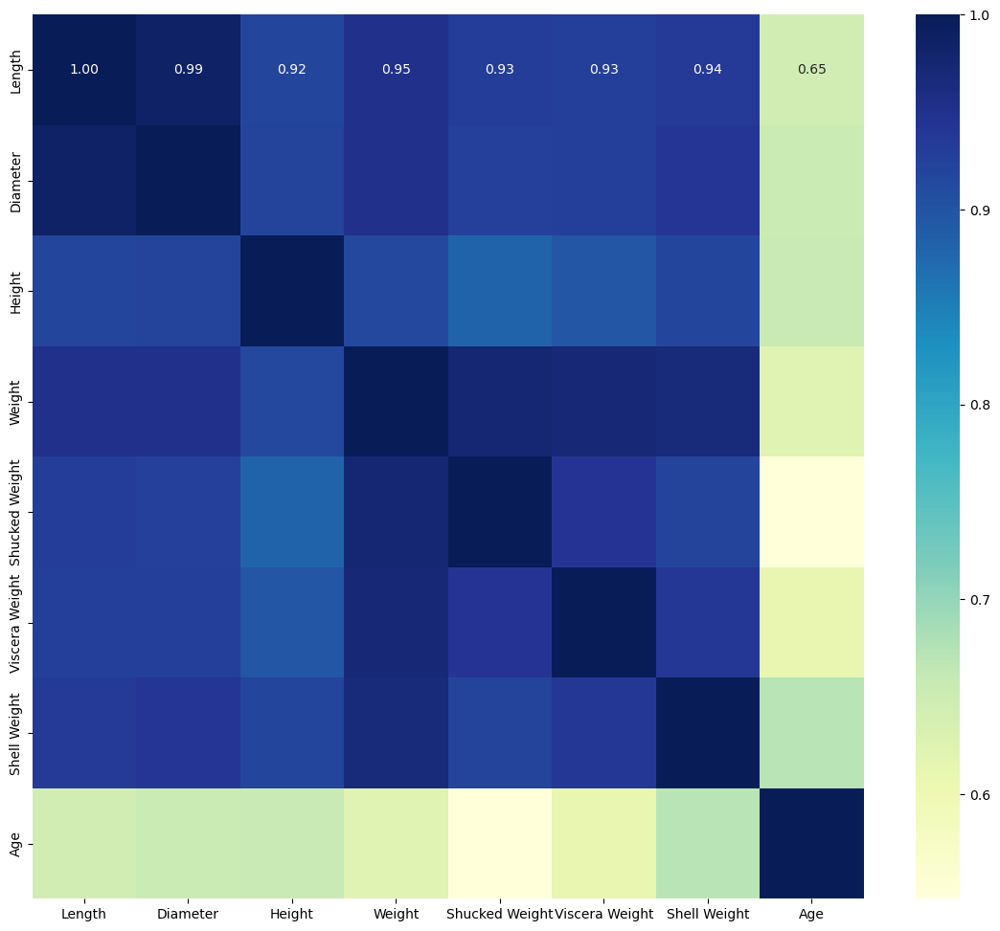

In [57]:
# Set up the figure size and annotation font size
plt.figure(figsize=(14, 12))
sns.heatmap(crab_train_data_prep[num_col_ls].corr(), annot=True, fmt=".2f", annot_kws={"size": 10}, cmap="YlGnBu")

<Axes: >

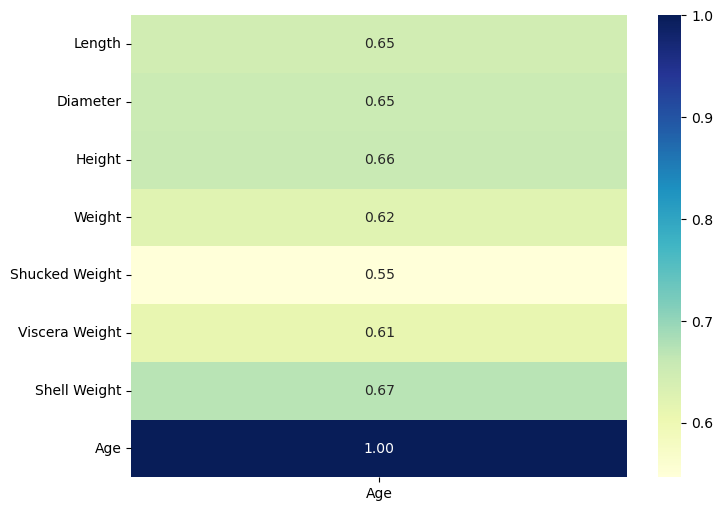

In [60]:
plt.figure(figsize=(8, 6))
sns.heatmap(crab_train_data_prep[num_col_ls].corr()[['Age']], annot=True, fmt=".2f", annot_kws={"size": 10}, cmap="YlGnBu")

# Sample split

In [50]:
crab_train_data_prep.head()

,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,I,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9
1,I,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8
2,M,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9
3,F,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11
4,I,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8


In [73]:
X = crab_train_data_prep[['Sex','Shell Weight']]
y = crab_train_data_prep['Age']

In [86]:
X_train, X_val,y_train,y_val = train_test_split(X,y,test_size =0.2,random_state=42)

In [87]:
X_train.head()

,Sex,Shell Weight
39474,I,3.968930
55132,F,7.229122
72336,F,8.930093
62828,M,0.708738
43956,F,14.883487


In [88]:
scaler = StandardScaler()

# get numeric data
X_train_num = X_train.select_dtypes(exclude=['object'])

# update the cols with their normalized values
X_train[X_train_num.columns] = scaler.fit_transform(X_train_num)

In [89]:
X_train = pd.get_dummies(X_train,drop_first=True)

In [90]:
X_train.head()

,Shell Weight,Sex_I,Sex_M
39474,-0.795983,True,False
55132,0.210044,False,False
72336,0.734927,False,False
62828,-1.802011,False,True
43956,2.572021,False,False


In [92]:
X_val_num = X_val.select_dtypes(exclude=['object'])
X_val[X_val_num.columns] = scaler.transform(X_val_num)

In [98]:
X_val = pd.get_dummies(X_val,drop_first=True)

In [99]:
X_val.head()

,Shell Weight,Sex_I,Sex_M
54781,-0.271100,False,False
43289,-0.839724,True,False
31244,-0.271100,True,False
24228,1.522253,False,False
58435,-1.495828,True,False


# Train model

In [100]:
model_ls = [DecisionTreeRegressor(),RandomForestRegressor(),GradientBoostingRegressor()
            ,SVR(),AdaBoostRegressor(),ExtraTreesRegressor(),XGBRegressor()]

In [101]:
m_ls=['decision tree','random forest','gradient boosting','svr','adaboost','extratree','xgboost']
mse_ls=[]
mape_ls=[]
r2_ls=[]


for m in model_ls:
    model = m
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    mse = mean_squared_error(y_val, y_pred)
    mape = mean_absolute_percentage_error(y_val, y_pred)
    r2 = r2_score(y_val, y_pred)
    
    mse_ls.append(mse)
    mape_ls.append(mape)
    r2_ls.append(r2)

In [102]:
eval_df = pd.DataFrame(
    {'model': m_ls,
     'mse': mse_ls,
     'mape': mape_ls,
     'r2': r2_ls
    })

In [103]:
eval_df

,model,mse,mape,r2
0,decision tree,2.598487,0.126542,0.500941
1,random forest,2.582316,0.126315,0.504046
2,gradient boosting,2.531070,0.125139,0.513889
3,svr,2.642488,0.117988,0.492490
4,adaboost,3.089673,0.164174,0.406604
5,extratree,2.595155,0.126492,0.501581
6,xgboost,2.541534,0.125366,0.511879


# Hyperparameter tuning

In [107]:
gbr = GradientBoostingRegressor()

100
125
150
175
200
225
250
275
300
325
350
375
400
425
450
475


/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


<Axes: >

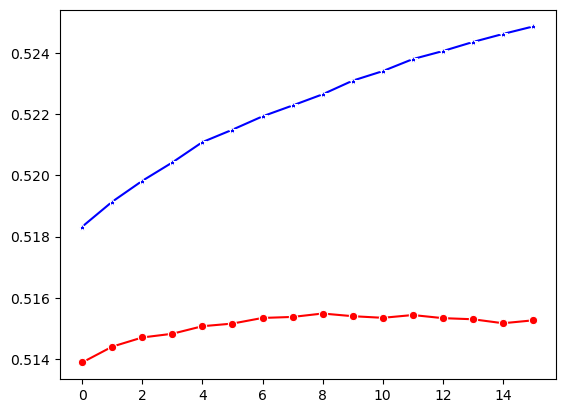

In [112]:
train_scores = []
val_scores = []
for i in range(100, 500,25):
    print(i)
    gbr = GradientBoostingRegressor(n_estimators = i)
    gbr.fit(X_train, y_train)
    train_scores.append(gbr.score(X_train, y_train))
    val_scores.append(gbr.score(X_val, y_val))
sns.lineplot(train_scores, marker = '*', color = 'b')
sns.lineplot(val_scores, marker = 'o', color = 'r')

1
2
3
4
5
6
7
8
9


/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


<Axes: >

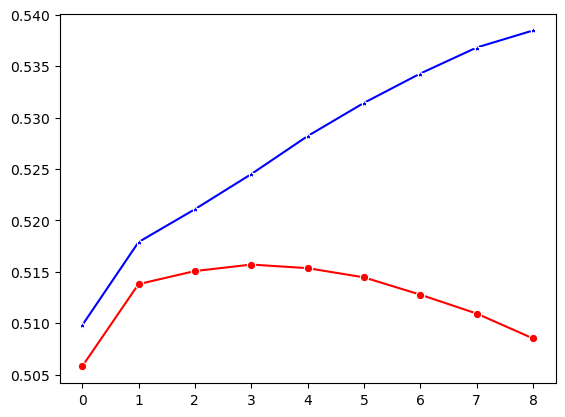

In [113]:
train_scores = []
val_scores = []
for i in range(1, 10):
    print(i)
    gbr = GradientBoostingRegressor(n_estimators = 200,max_depth=i)
    gbr.fit(X_train, y_train)
    train_scores.append(gbr.score(X_train, y_train))
    val_scores.append(gbr.score(X_val, y_val))
sns.lineplot(train_scores, marker = '*', color = 'b')
sns.lineplot(val_scores, marker = 'o', color = 'r')


0.01
0.02
0.03
0.04
0.05
0.06
0.07
0.08
0.09
0.1


/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
/Users/pimawatmingkwan/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


<Axes: >

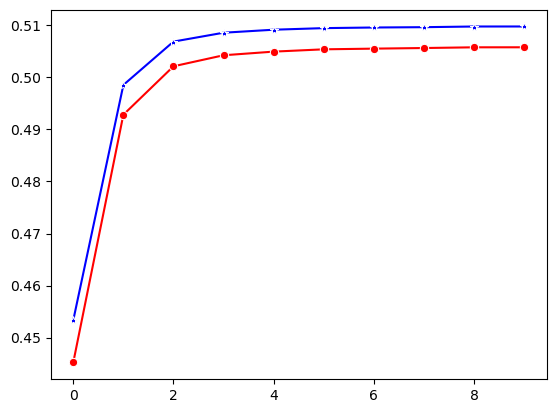

In [117]:
train_scores = []
val_scores = []
for i in [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1]:
    print(i)
    gbr = GradientBoostingRegressor(n_estimators = 200,max_depth=1,learning_rate = i )
    gbr.fit(X_train, y_train)
    train_scores.append(gbr.score(X_train, y_train))
    val_scores.append(gbr.score(X_val, y_val))
sns.lineplot(train_scores, marker = '*', color = 'b')
sns.lineplot(val_scores, marker = 'o', color = 'r')